# TBNet: Building a Robust Neural Network for Precise TB Diagnosis


In [1]:
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import numpy as np
from numpy import asarray
import os
from tqdm import tqdm

### Data Preprocessing

Transforming images from .PNG to numpy arrays

In [3]:
# we are creating a function that will convert images to numpy arrays
def numpize(subset: str, img_size=(128, 128), grayscale=False):

    image_dir = os.path.join(r'C:\Users\forbh\Downloads\dnn project folder\TB_Chest_Radiography_Database', subset)
    image_files = os.listdir(image_dir)
    image_count = len(image_files)
    transformed_images = []

    '''
    so we are using tqdm library to add a progress bar with description as 'Transforming'
    '''
    for i in tqdm(range(1, image_count + 1), desc='Transforming...'):  # this loop will iterate from 1 to total images in a subset
        image_path = f'{image_dir}/{subset}-{i}.png' # this is to create the image path 
        image = Image.open(image_path)

        # Ensure all images are in the same format
        if grayscale:
            image = image.convert('L')  # Convert to grayscale
        else:
            image = image.convert('RGB')  # Convert to RGB

        # Resize all images to the specified size without padding
        resized_image = image.resize(img_size)
        data = np.asarray(resized_image) # converts data into numpy arrays
        transformed_images.append(data)

    numpy_array = np.array(transformed_images)
    return numpy_array

In [4]:
norm = numpize(subset='Normal', 
               img_size=(128, 128), 
               grayscale=False)
norm.shape

Transforming...:   0%|          | 5/3500 [00:00<01:11, 49.16it/s]

Transforming...: 100%|██████████| 3500/3500 [00:53<00:00, 65.59it/s]


(3500, 128, 128, 3)

In [5]:
tb = numpize(subset='Tuberculosis', 
             img_size=(128, 128), 
             grayscale=False)
tb.shape

Transforming...: 100%|██████████| 700/700 [00:10<00:00, 67.68it/s]


(700, 128, 128, 3)

#### creating target labels

In [6]:
# creating target label for normal images
target_norm = np.zeros(norm.shape[0]) # creating array of zeros where 0 represents absence of TB
print(f'Shape: {target_norm.shape[0]}, array: {target_norm}')

Shape: 3500, array: [0. 0. 0. ... 0. 0. 0.]


In [7]:
# creating target label for Tuberculosis images
target_tb = np.ones(tb.shape[0]) # creating array of ones where 1 represents presence of TB
print(f'Shape: {target_tb.shape[0]}, array: {target_tb}')

Shape: 700, array: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

In [8]:
def show_image(images, target, title, num_display=16, num_cols=4, cmap='gray', random_mode=False):
    
    # Ensure num_cols is not zero
    if num_cols == 0:
        num_cols = 1
    
    # Determine the number of rows based on the num_cols parameter
    n_cols = min(num_cols, num_display)
    print("num_display:", num_display)
    print("num_cols:", num_cols)
    n_rows = int(np.ceil(num_display / n_cols))
    
    n_images = min(num_display, len(images))
    if random_mode:
        random_indices = np.random.choice(len(images), num_display, replace=False)
    else:
        random_indices = np.arange(num_display)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))
    axes = axes.flatten()
    
    for i in range(n_images):
        # Incase (Did PCA)
        index = random_indices[i]
        if len(images.shape) == 2:
            image = images[index].reshape((128, 128)).astype(int)
        else:
            image = images[index]
        
        axes[i].imshow(image, cmap=cmap)
        axes[i].set_title(f'Target: {target[index]}')
        axes[i].axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


num_display: 4
num_cols: 4


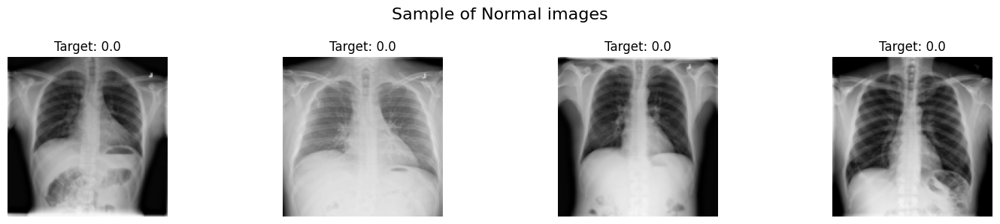

In [9]:
show_image(images=norm, 
           target=target_norm,
           title='Sample of Normal images',
           num_display=4, 
           num_cols=4, 
           cmap='gray', 
           random_mode=True)

num_display: 4
num_cols: 4


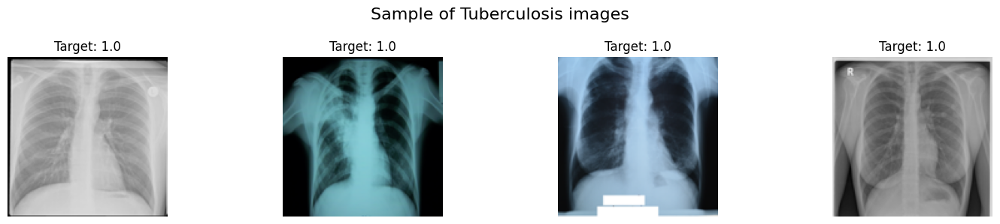

In [10]:
show_image(images=tb, 
           target=target_tb,
           title='Sample of Tuberculosis images',
           num_display=4, 
           num_cols=4, 
           cmap='gray', 
           random_mode=True)

In [11]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator # for augmentation and preprocessing of images during training
import random

## Augmenting images

Data augmentation is a technique commonly used in machine learning and deep learning to increase the diversity of training data by applying various transformations to existing data points. The goal of data augmentation is to create new, realistic variations of the original data that can help improve the performance and robustness of machine learning models, particularly in tasks like image classification


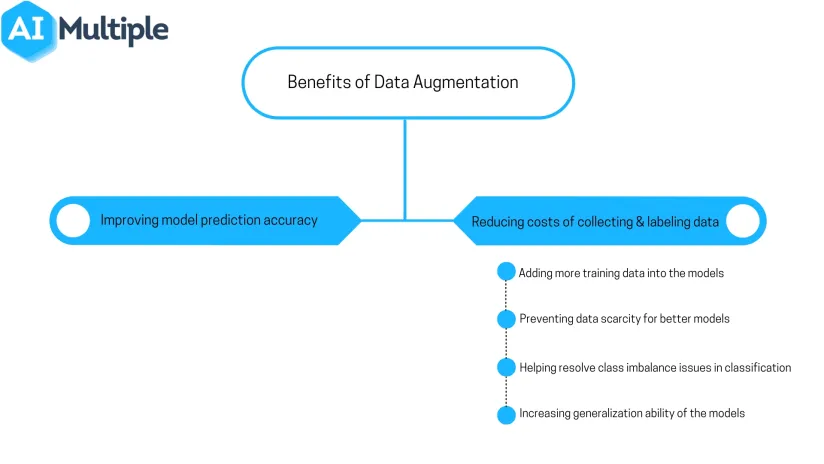

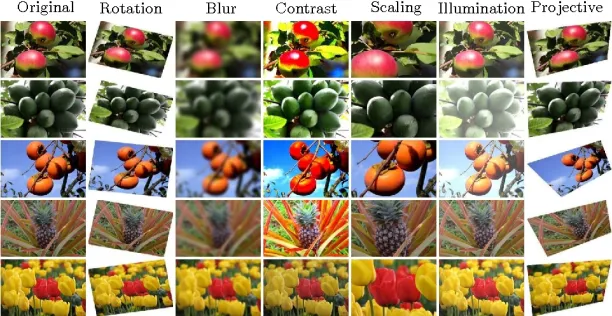

In [12]:
def x_ray_image_augmentation(images, targets, data_needed):

    # Randomize the data augmentation parameters
    rotation_range = random.randint(-6, 6) 
    zoom_range = random.uniform(0.0, 0.1)
    fill_mode = random.choice(['nearest',
                               'constant',
                               'wrap']) 

    # Create the ImageDataGenerator with randomized parameters
    datagen = ImageDataGenerator(
        rotation_range=rotation_range,
        zoom_range = zoom_range,
        fill_mode=fill_mode
    )

    # Load and augment the data
    augmented_data_generator = datagen.flow(images, targets, batch_size=1)
    batch_images, batch_labels = augmented_data_generator.next() # retrieves next batch of augmented images and their labels
    for _ in tqdm(range(data_needed), desc='augmenting...'):
        batch_images, batch_labels = augmented_data_generator.next()
        try:
            # it concatenates the batch images and labels with the existing ones
            combined_images = np.concatenate(
                (combined_images, batch_images), axis=0)
            combined_labels = np.concatenate(
                (combined_labels, batch_labels), axis=0)
        except NameError:
            combined_images = np.concatenate((images, batch_images), axis=0)
            combined_labels = np.concatenate((targets, batch_labels), axis=0)

    return combined_images, combined_labels


In [13]:
# Scaled the dataset before do Augmentation 
norm = norm/255
tb = tb/255

num_display: 16
num_cols: 8


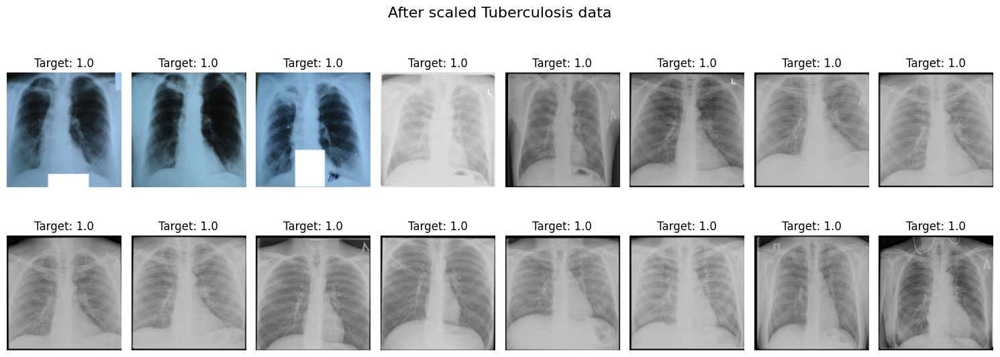

In [14]:
show_image(images=tb,
           target=target_tb,
           title='After scaled Tuberculosis data', 
           num_display=16, 
           num_cols=8, 
           cmap='gray', 
           random_mode=False)

In [15]:
tb_augmented, target_tb_augmented = x_ray_image_augmentation(images=tb, 
                                                             targets=target_tb, 
                                                             data_needed=2800)

augmenting...:   0%|          | 0/2800 [00:00<?, ?it/s]

augmenting...: 100%|██████████| 2800/2800 [10:08<00:00,  4.60it/s]


In [16]:
tb_augmented.shape

(3500, 128, 128, 3)

In [17]:
print(
    f'Before {tb.shape[0]}\nAfter Data Augmentation {tb_augmented.shape[0]}\n+{tb_augmented.shape[0]-tb.shape[0]} Training examples')

Before 700
After Data Augmentation 3500
+2800 Training examples


num_display: 16
num_cols: 8


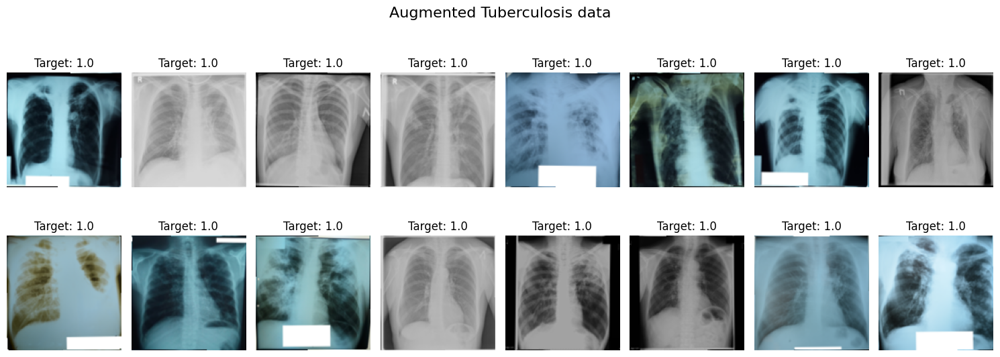

In [18]:
# Start index since 700 to last to observe to new training images
show_image(images=tb_augmented[700:-1],
           target=target_tb_augmented[700:-1],
           title='Augmented Tuberculosis data', 
           num_display=16, 
           num_cols=8, 
           cmap='gray', 
           random_mode=False)

In [19]:
images_2 = [tb, tb_augmented]
subsets_2 = ['X_{Tuberculosis}', 'X_{TuberculosisAugmentation}']

In [20]:
# Concatenate df_norm and df_tb along the first axis (samples)
X = np.concatenate((norm, tb_augmented), axis=0)

# Concatenate target_norm and target_tb
y = np.concatenate((target_norm,  target_tb_augmented), axis=0)

In [21]:
X.shape

(7000, 128, 128, 3)

In [22]:
y.shape

(7000,)

In [23]:
import pandas as pd

In [24]:
y_df = pd.DataFrame(y)
y_df.value_counts()

0.0    3500
1.0    3500
Name: count, dtype: int64

Balanced dataset!

### Now we will use Image Enhancement techniques to check if they give any significant improvement in intensity

CLAHE (Contrast Limited Adaptive Histogram Equalization):

* CLAHE is an image enhancement technique used to improve contrast in images by redistributing pixel intensities.
* It divides the image into small tiles and applies histogram equalization to each tile separately.
* To prevent overamplification of noise in areas with low contrast, CLAHE limits the contrast amplification by clipping the histogram.
* This method is particularly useful for enhancing local contrast in images with varying illumination conditions.

Gamma Correction:

* Gamma correction is a nonlinear adjustment applied to images to correct for the nonlinear relationship between pixel values and brightness perceived by the human eye.
* It involves applying a power-law function to the pixel values, where each pixel's intensity is raised to the power of gamma (γ).
* Gamma correction can be used to adjust the overall brightness and contrast of an image.
* It is commonly used in image processing and display to ensure accurate reproduction of images across different devices and viewing conditions.

In [26]:
from skimage import exposure
import numpy as np
from tqdm import tqdm

def clahe(X, clip_limit, batch_size=None):
    '''
    Apply Contrast Limited Adaptive Histogram Equalization (CLAHE) to the input data.

    :Parameters:
    X (ndarray): Input data as a numpy array. X.shape should be (n, m, 1) or (n, m).
    clip_limit (int or float): Clip limit parameter for CLAHE.
    batch_size (int): Size of the batch to process. If None, the entire input is processed at once.
    '''
    if batch_size is None:
        # Apply CLAHE to the entire input
        clahe_img = exposure.equalize_adapthist(X, clip_limit=clip_limit)
    else:
        # Process data in batches
        num_batches = int(np.ceil(len(X) / batch_size))
        batch_results = []

        for i in tqdm(range(num_batches), desc='Processing batches...'):
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(X))

            # Apply CLAHE to each batch
            clahe_img_batch = exposure.equalize_adapthist(
                X[start_idx:end_idx], clip_limit=clip_limit)
            batch_results.append(clahe_img_batch)

        # Concatenate batch results
        clahe_img = np.concatenate(batch_results, axis=0)

    return clahe_img

def gamma_correction(X, gamma, batch_size=None):
    '''
    Apply Gamma Correction to the input data.

    :Parameters:
    X (ndarray): Input data as a numpy array. X.shape should be (n, m, 1) or (n, m).
    gamma (float): Gamma correction parameter.
    batch_size (int): Size of the batch to process. If None, the entire input is processed at once.
    '''
    if batch_size is None:
        # Apply Gamma Correction to the entire input
        gamma_img = exposure.adjust_gamma(X, gamma=gamma)
    else:
        # Process data in batches
        num_batches = int(np.ceil(len(X) / batch_size))
        batch_results = []

        for i in tqdm(range(num_batches), desc='Processing batches...'):
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(X))

            # Apply Gamma Correction to each batch
            gamma_img_batch = exposure.adjust_gamma(
                X[start_idx:end_idx], gamma=gamma)
            batch_results.append(gamma_img_batch)

        # Concatenate batch results
        gamma_img = np.concatenate(batch_results, axis=0)

    return gamma_img


num_display: 16
num_cols: 8


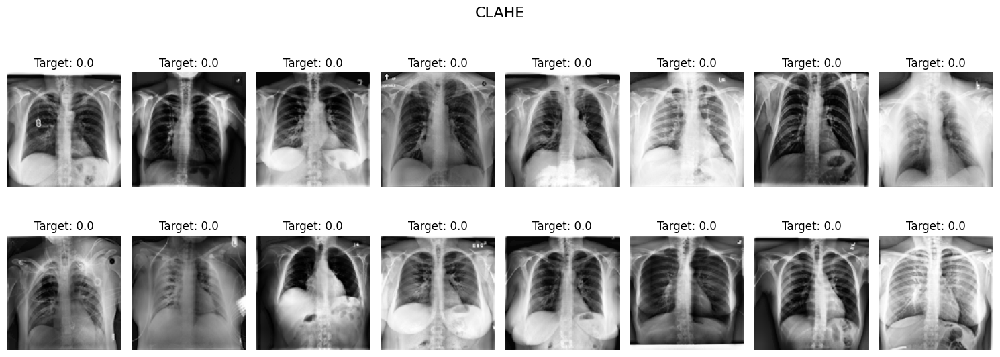

In [27]:
X_clahe = clahe(X[0:64], clip_limit=0.03)
show_image(images=X_clahe,
            target=y,
            title='CLAHE', 
            num_display=16, 
            num_cols=8, 
            cmap='gray', 
            random_mode=True)



num_display: 16
num_cols: 8


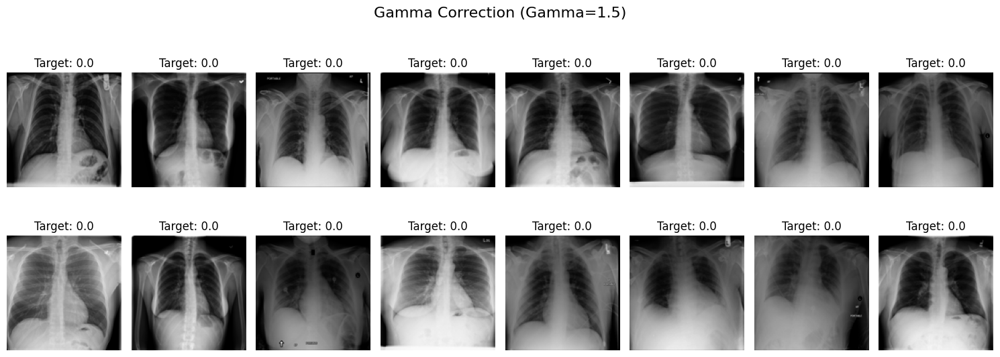

In [28]:
X_gamma_corrected = gamma_correction(X[0:64], gamma=1.5)
show_image(images=X_gamma_corrected,
            target=y,
            title='Gamma Correction (Gamma=1.5)', 
            num_display=16, 
            num_cols=8, 
            cmap='gray', 
            random_mode=True)


Contrast stretching is an Image Enhancement method which attempts to improve an image by stretching the range of intensity values

In [29]:
def contrast_stretching(X):
    # Calculate the mean intensity before stretching
    mean_intensity_before = np.mean(X)

    # Calculate the 2nd and 98th percentiles of pixel values in the images
    p2, p98 = np.percentile(X, (2, 98))

    # Stretch the intensity range using the calculated percentiles
    stretched_img = exposure.rescale_intensity(X, in_range=(p2, p98))

    # Calculate the mean intensity after stretching
    mean_intensity_after = np.mean(stretched_img)

    # Calculate the improvement in intensity
    improvement = mean_intensity_after - mean_intensity_before

    return stretched_img, improvement


Improvement in contrast: 0.03802552002931847
num_display: 16
num_cols: 8


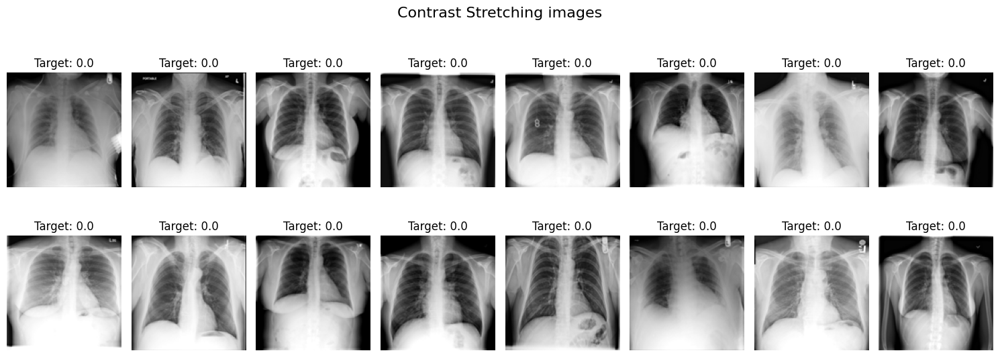

In [30]:
X_stretched, improvement = contrast_stretching(X[:32])
print("Improvement in contrast:", improvement)
show_image(images=X_stretched,
           target=y,
           title=f'Contrast Stretching images', 
           num_display=16, 
           num_cols=8, 
           cmap='gray', 
           random_mode=True)

Unsharp masking is a technique used in image processing to sharpen an image by enhancing edges and fine details. It involves creating a sharpened version of the image by subtracting a blurred version of the original image from the original, thereby accentuating edges. This process helps to increase the apparent sharpness and clarity of the image.

In [31]:
from scipy.ndimage import gaussian_filter
def unsharp_mask(image, sigma=2.0, strength=0.9):
    # Apply a Gaussian filter to blur the image
    blurred = gaussian_filter(image, sigma=sigma)
    
    # Calculate the sharpened image
    sharpened = image + strength * (image - blurred)
    
    # Clip the values to ensure they are within the valid range [0, 1]
    sharpened = np.clip(sharpened, 0, 1)

    mean_intensity_before = np.mean(image)
    mean_intensity_after = np.mean(sharpened)
    improvement = mean_intensity_after - mean_intensity_before    

    return sharpened, improvement

X_sharpened, improvement = unsharp_mask(X[0:32])
print("Change in mean intensity:", improvement)

Change in mean intensity: 0.009452756798573603


In [32]:
X_sharpened, improvement = unsharp_mask(X[:32])

Change in mean intensity: 0.009452756798573603
num_display: 16
num_cols: 8


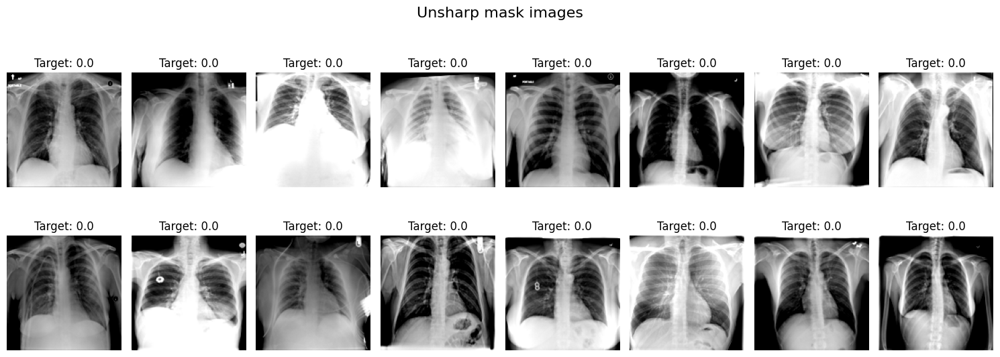

In [33]:
print("Change in mean intensity:", improvement)
show_image(images=X_sharpened,
           target=y,
           title='Unsharp mask images', 
           num_display=16, 
           num_cols=8, 
           cmap='gray', 
           random_mode=True)

Histogram equalization is a technique used in image processing to enhance the contrast of an image by spreading out the intensity values across the entire range. It works by adjusting the pixel intensities so that the histogram of the output image is approximately flat, which results in a more balanced distribution of pixel values. This technique is particularly useful for images with low contrast or uneven lighting conditions, as it can improve the overall visual quality and detail.

In [34]:
def equalization(X):
    eq_img = exposure.equalize_hist(X)

    # Calculate the mean intensity before stretching
    mean_intensity_before = np.mean(X)

    # Calculate the mean intensity after stretching
    mean_intensity_after = np.mean(eq_img)

    # Calculate the improvement in intensity
    improvement = mean_intensity_after - mean_intensity_before
    return eq_img,improvement


Change in mean intensity: -0.027155858318342108
num_display: 16
num_cols: 8


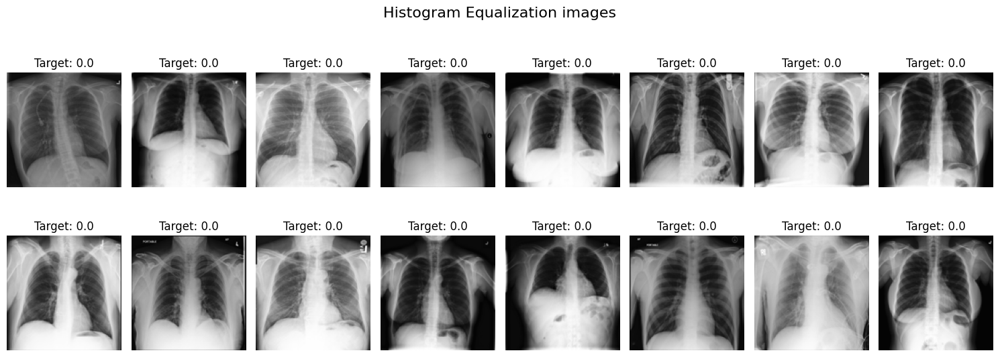

In [35]:
X_eq , improvement = equalization(X[0:32])
print("Change in mean intensity:", improvement)
show_image(images=X_eq,
           target=y,
           title='Histogram Equalization images', 
           num_display=16, 
           num_cols=8, 
           cmap='gray', 
           random_mode=True)


Adaptive histogram equalization (AHE) is an enhancement of traditional histogram equalization that operates locally rather than globally. It divides the image into smaller regions and performs histogram equalization on each of these regions independently. This allows AHE to adapt to variations in contrast within different parts of the image, resulting in better preservation of local details and avoiding over-enhancement of noise. AHE is particularly effective in enhancing images with uneven illumination or varying contrast levels across different regions.

In [36]:
def adaptive_equalization(X, clip_limit, batch_size=None):
  
    if batch_size is None:
        # Normalize the input image to the range of -1 to 1 and perform adaptive histogram equalization
        X_normalized = (X - np.min(X)) / (np.max(X) - np.min(X))
        X_normalized = (X_normalized * 2) - 1  # Scale to -1 to 1
        adapteq_img = exposure.equalize_adapthist(
            X_normalized, clip_limit=clip_limit)
        
        mean_intensity_before = np.mean(X)
        mean_intensity_after = np.mean(adapteq_img)
        improvement = mean_intensity_after - mean_intensity_before

    else:
        # Process data in batches
        num_batches = int(np.ceil(len(X) / batch_size))
        batch_results = []

        for i in tqdm(range(num_batches),desc='process...'):
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(X))

            # Normalize the input image to the range of -1 to 1 and perform adaptive histogram equalization for each batch
            X_normalized = (X[start_idx:end_idx] - np.min(X[start_idx:end_idx])) / \
                (np.max(X[start_idx:end_idx]) - np.min(X[start_idx:end_idx]))
            X_normalized = (X_normalized * 2) - 1  # Scale to -1 to 1
            adapteq_img_batch = exposure.equalize_adapthist(
                X_normalized, clip_limit=clip_limit)
            batch_results.append(adapteq_img_batch)

        # Concatenate the batch results
        adapteq_img = np.concatenate(batch_results, axis=0)
        #intensity before
        mean_intensity_before = np.mean(X)
        # Calculate the mean intensity after adaptive equalization
        mean_intensity_after = np.mean(adapteq_img)
        # Calculate the improvement in intensity
        improvement = mean_intensity_after - mean_intensity_before    

    return adapteq_img,improvement


Change in mean intensity: -0.23349380737848585
num_display: 16
num_cols: 8


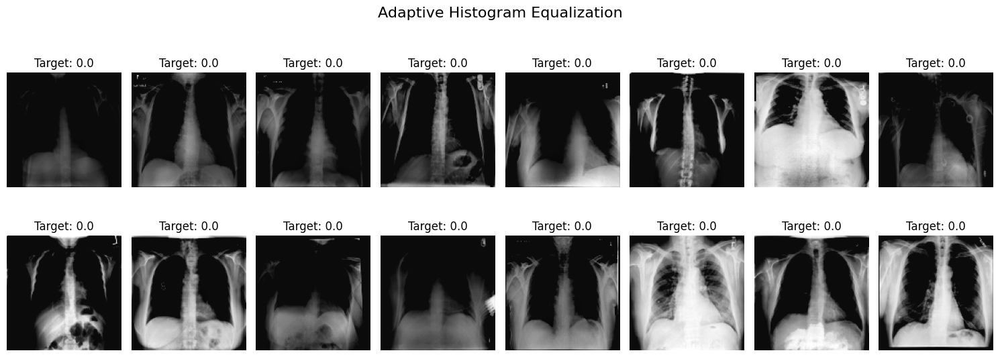

In [37]:
X_adapteq,improvement = adaptive_equalization(X[0:64],0.05)
print("Change in mean intensity:", improvement)
show_image(images=X_adapteq,
            target=y,
            title='Adaptive Histogram Equalization', 
            num_display=16, 
            num_cols=8, 
            cmap='gray', 
            random_mode=True)

### Segmenting images to check for improvement if model is able to distinguish lungs more clearly after image enhancing

In [38]:
from skimage.filters import threshold_otsu
from skimage.color import label2rgb
from skimage.morphology import closing, square
from skimage.measure import label, regionprops
from skimage.segmentation import clear_border

class ImageSegmentation:
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def lung_segmentation(self, X):
        if X.shape != self.input_shape:
            X = X[:, :, 0]

        # Equalize the image with CLAHE
        X = exposure.equalize_adapthist(
            X, kernel_size=None, clip_limit=0.01, nbins=256)

        # Create a binary threshold mask and apply it to the image
        thresh = threshold_otsu(image=X, nbins=256, hist=None)
        thresh = X > thresh
        bw = closing(X > thresh, square(1))

        # Clean up the borders
        cleared = clear_border(bw)

        # Label image regions
        label_image = label(cleared)
        image_label_overlay = label2rgb(
            label_image,
            image=X,
            bg_label=0,
            bg_color=(0, 0, 0))

        return image_label_overlay, label_image

    def show_segmented_images(self,images, target, title, num_display=16, num_cols=4, cmap='gray', random_mode=False,only_segmented=True):
        # Determine the number of rows based on the num_cols parameter
        n_cols = min(num_cols, num_display)
        n_rows = int(np.ceil(num_display / n_cols))

        n_images = min(num_display, len(images))
        if random_mode:
            random_indices = np.random.choice(
                len(images), num_display, replace=False)
        else:
            random_indices = np.arange(num_display)

        fig, axes = plt.subplots(
            nrows=n_rows, ncols=n_cols, figsize=(20, 4*n_rows))
        for i, ax in enumerate(axes.flatten()):
            if i >= n_images:  # Check if the index exceeds the available number of images
                break
            # Incase (Did PCA)
            index = random_indices[i]
            if len(images.shape) == 2:
                image = images[index].reshape((128, 128)).astype(int)
            else:
                image = images[index]

            image_label_overlay, label_image = self.lung_segmentation(
                image)
                
            ax.imshow(
                label_image if only_segmented else image_label_overlay, cmap=cmap)
            ax.set_title("Target: {}".format(target[index]))

            # Add image index as text
            ax.text(0.5, -0.15, f'Image Index: {index}', transform=ax.transAxes,
                    fontsize=10, ha='center')

        plt.suptitle(f"{title} (Displaying {num_display} Images)",
                    fontsize=16, fontweight='bold')

        fig.set_facecolor('white')
        plt.tight_layout()  # Added to ensure proper spacing between subplots
        return plt.show()

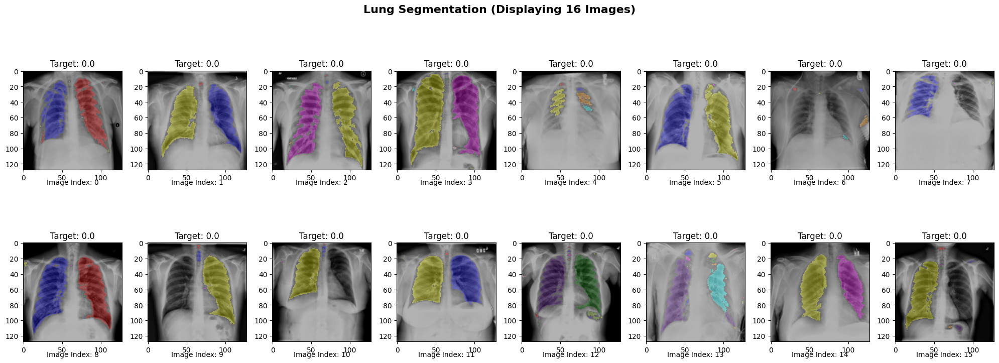

In [39]:
img_segmetator=ImageSegmentation(input_shape=(128,128))
img_segmetator.show_segmented_images(images=X,
                                     target=y,
                                     num_display=16, num_cols=8,
                                     title='Lung Segmentation',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=False)

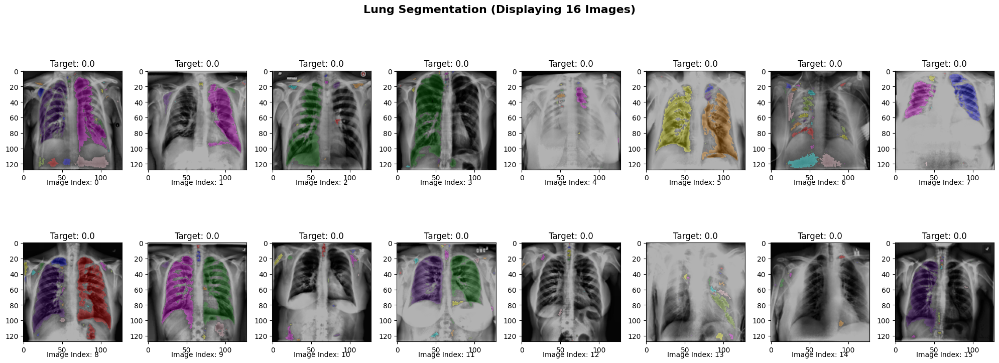

In [40]:
img_segmetator=ImageSegmentation(input_shape=(128,128))
img_segmetator.show_segmented_images(images=X_clahe,
                                     target=y,
                                     num_display=16, num_cols=8,
                                     title='Lung Segmentation',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=False)

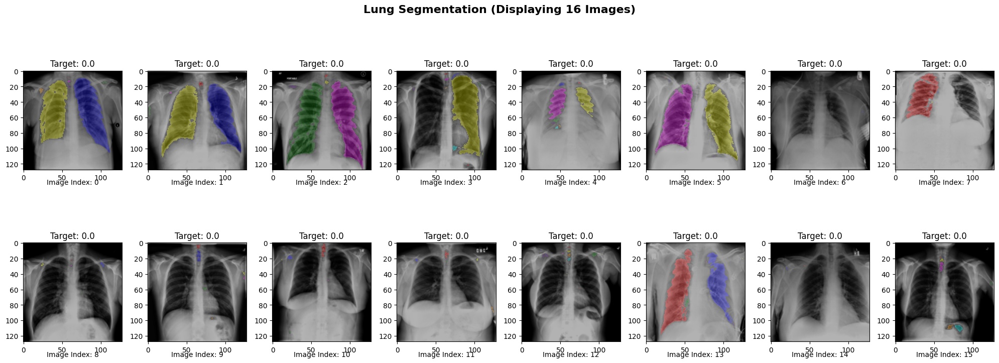

In [41]:
img_segmetator=ImageSegmentation(input_shape=(128,128))
img_segmetator.show_segmented_images(images=X_gamma_corrected,
                                     target=y,
                                     num_display=16, num_cols=8,
                                     title='Lung Segmentation',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=False)

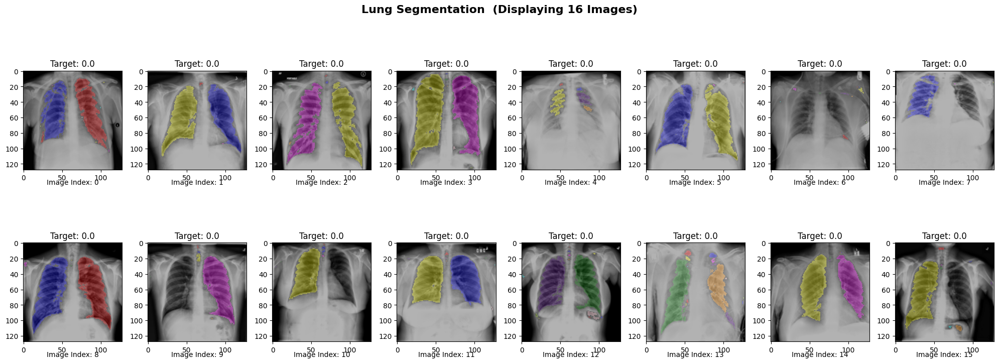

In [42]:
img_segmetator=ImageSegmentation(input_shape=(128,128))
img_segmetator.show_segmented_images(images=X_stretched,
                                     target=y,
                                     num_display=16, num_cols=8,
                                     title='Lung Segmentation ',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=False)

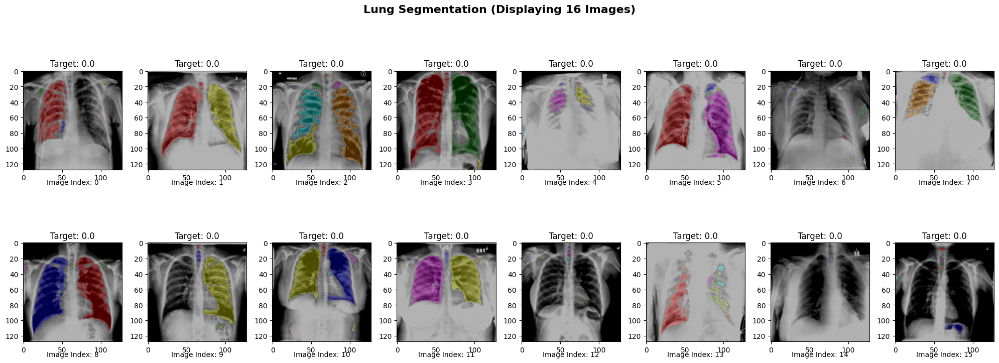

In [43]:
img_segmetator=ImageSegmentation(input_shape=(128,128))
img_segmetator.show_segmented_images(images=X_sharpened,
                                     target=y,
                                     num_display=16, num_cols=8,
                                     title='Lung Segmentation',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=False)

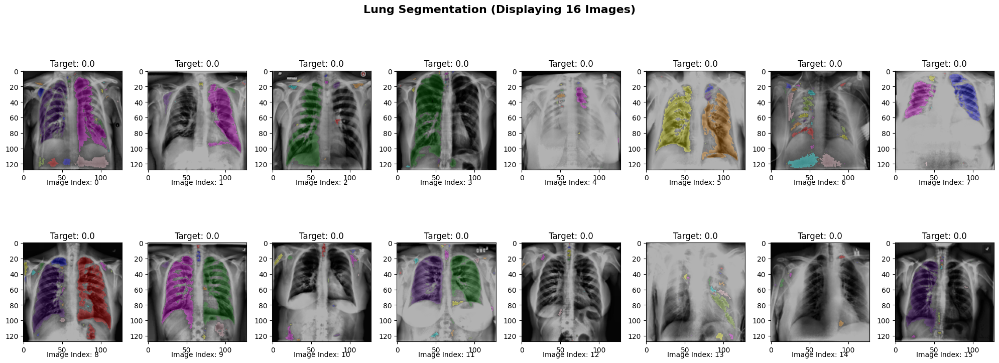

In [44]:
img_segmetator=ImageSegmentation(input_shape=(128,128))
img_segmetator.show_segmented_images(images=X_clahe,
                                     target=y,
                                     num_display=16, num_cols=8,
                                     title='Lung Segmentation',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=False)

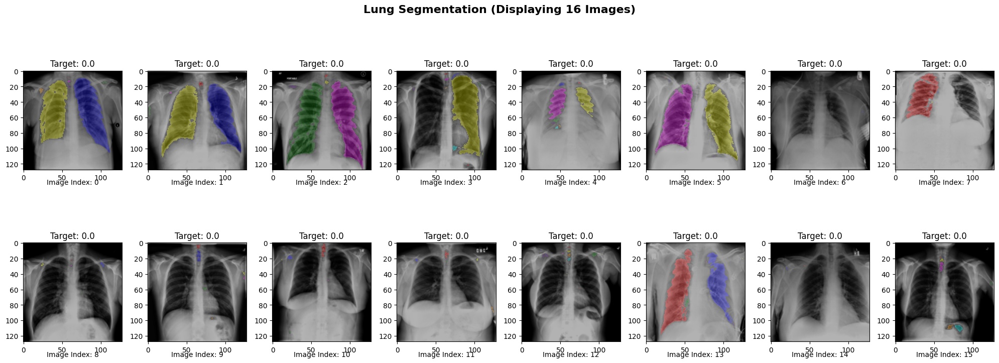

In [45]:
img_segmetator=ImageSegmentation(input_shape=(128,128))
img_segmetator.show_segmented_images(images=X_gamma_corrected,
                                     target=y,
                                     num_display=16, num_cols=8,
                                     title='Lung Segmentation',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=False)

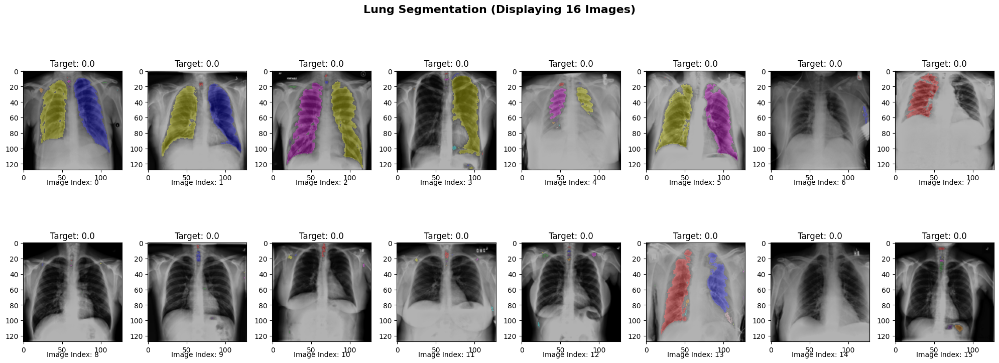

In [46]:
img_segmetator=ImageSegmentation(input_shape=(128,128))
img_segmetator.show_segmented_images(images=X_eq,
                                     target=y,
                                     num_display=16, num_cols=8,
                                     title='Lung Segmentation',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=False)

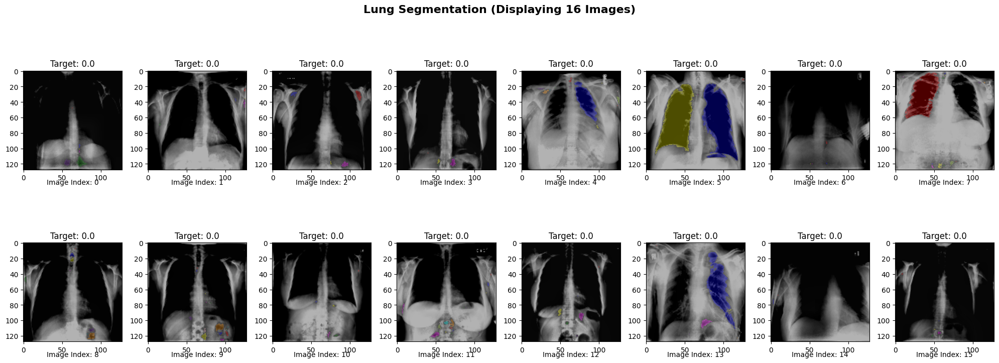

In [47]:
img_segmetator=ImageSegmentation(input_shape=(128,128))
img_segmetator.show_segmented_images(images=X_adapteq,
                                     target=y,
                                     num_display=16, num_cols=8,
                                     title='Lung Segmentation',
                                     cmap='binary',
                                     random_mode=False,
                                     only_segmented=False)

#### As we can see there is no significant impact on images so we are not using any Enhancement Techniques

### Building CNN model

In [224]:
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Flatten, Dropout, Dense
class CNN:
    def __init__(self, 
                 input_shape=(128, 128, 3),
                 unit_size_rate=0.05, 
                 conv_padding='same',
                 optimizer = 'adam', 
                 conv_kernel_size=(3, 3),
                 conv_stride=1, 
                 pool_padding='same', 
                 pool_kernel_size=(2, 2), 
                 pool_stride=2, 
                 dropout=0, 
                 l1_lambda=None,
                 l2_lambda=None, 
                 pooling_type='max', 
                 epochs=5, 
                 batch_size=50, 
                 verbose=1):
        self.optimizer = optimizer
        self.input_shape = input_shape
        self.unit_size_rate = unit_size_rate
        self.conv_padding = conv_padding
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.pool_padding = pool_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.dropout = dropout
        self.l1_lambda = l1_lambda
        self.l2_lambda = l2_lambda
        self.pooling_type = pooling_type
        self.epochs = epochs
        self.batch_size = batch_size
        self.verbose = verbose
        self.model = self.build_model()

    def build_model(self):
        reg_l1 = None
        reg_l2 = None

        if self.l1_lambda is not None:
            reg_l1 = tf.keras.regularizers.l1(self.l1_lambda)

        if self.l2_lambda is not None:
            reg_l2 = tf.keras.regularizers.l2(self.l2_lambda)

        if len(self.input_shape) == 2:
            # Add color channel for grayscale images
            self.input_shape = self.input_shape + (1,)

        model = Sequential()
        model.add(Conv2D(
            int(32 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            activation='relu',
            kernel_regularizer=reg_l1,
            input_shape=self.input_shape))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(64 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(128 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")
        
        model.add(Conv2D(
            int(256 * self.unit_size_rate),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        model.add(Flatten())
        model.add(Dense(
            units=int(128 * self.unit_size_rate),
            activation='relu',
            kernel_regularizer=reg_l2))

        model.add(Dropout(self.dropout))
        model.add(Dense(units=1, activation='sigmoid'))

        if self.optimizer == 'adam':
            optimizer = tf.keras.optimizers.Adam()
        elif self.optimizer == 'radam':
            optimizer = tfa.optimizers.RectifiedAdam()

        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        return model

    def predict(self, X, threshold=0.5, verbose=0):
        return (self.model.predict(X, verbose=verbose) > threshold).astype("int32")

    def summary(self):
        self.model.summary()

    def train(self, X_train, y_train, X_val, y_val, epochs, batch_size, verbose=1):
        history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size if batch_size else self.batch_size,
            epochs=epochs if epochs else self.epochs,
            verbose=verbose,
            validation_data=(X_val, y_val)
        )
        return history

In [225]:
cnn = CNN(unit_size_rate=1,
          optimizer='radam', # Using Rectified Adam optimizer
          input_shape=(128,128,3))

In [226]:
cnn.summary()

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_60 (Conv2D)          (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d_45 (MaxPooli  (None, 64, 64, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_61 (Conv2D)          (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_46 (MaxPooli  (None, 32, 32, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_62 (Conv2D)          (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_47 (MaxPooli  (None, 16, 16, 128)     

### splitting dataset into train, test , validaion

In [227]:
from sklearn.model_selection import train_test_split

In [241]:
def viz_class_distribution(X, y, title, classe_labels, train_percent=0.6, val_percent=0.2, test_percent=0.2):
    
    assert train_percent + val_percent + test_percent == 1.0, "Sum of train_percent, val_percent, and test_percent should be 1.0"

    # Convert y to integers
    y = y.astype(int)

    # Split the data
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=val_percent + test_percent, random_state=42, stratify=y)

    test_size = test_percent / (val_percent + test_percent)
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=test_size, random_state=42, stratify=y_temp)

    class_counts = np.bincount(y)
    class_balance_text = ' | '.join(
        [f'{class_label} ({count})' for class_label, count in zip(classe_labels, class_counts)])

    # Print the relevant information
    print(f'Title: {title}')
    print(f'Training examples (X): {X.shape[0]}')
    print(f'Target (y): {class_balance_text}')
    print(f'Number of training examples: {X_train.shape[0]}')
    print(f'Number of test examples: {X_test.shape[0]}')
    print(f'Number of validation examples: {X_val.shape[0]}')

    return X_train, y_train, X_test, y_test, X_val, y_val

X_train, y_train, X_test, y_test, X_val, y_val = viz_class_distribution(X=X, 
                                                                        y=y, 
                                                                        title='Class distribution after splitting', 
                                                                        classe_labels=['Normal', 'Tuberculosis'], 
                                                                        train_percent=0.6, 
                                                                        val_percent=0.2, 
                                                                        test_percent=0.2)


Title: Class distribution after splitting
Training examples (X): 7000
Target (y): Normal (3500) | Tuberculosis (3500)
Number of training examples: 4200
Number of test examples: 1400
Number of validation examples: 1400


In [242]:
model_config = {
    # (height, width, channels)
    'input_shape': (128, 128,3),
    'unit_size_rate': 0.05,
    'l1_lambda': None,
    'l2_lambda': None,

    'conv_padding': 'same',
    'conv_kernel_size': (3, 3),
    'conv_stride': 1,

    'pool_padding': 'same',
    'pool_kernel_size': (2, 2),
    'pool_stride': 2,
    
    'dropout': 0,
    'pooling_type': 'max'
}

# Build model
cnn_model = CNN(**model_config).build_model()
cnn_model.summary()

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_76 (Conv2D)          (None, 128, 128, 1)       28        
                                                                 
 max_pooling2d_57 (MaxPooli  (None, 64, 64, 1)         0         
 ng2D)                                                           
                                                                 
 conv2d_77 (Conv2D)          (None, 64, 64, 3)         30        
                                                                 
 max_pooling2d_58 (MaxPooli  (None, 32, 32, 3)         0         
 ng2D)                                                           
                                                                 
 conv2d_78 (Conv2D)          (None, 32, 32, 6)         168       
                                                                 
 max_pooling2d_59 (MaxPooli  (None, 16, 16, 6)       

In [243]:
import time

In [244]:
import tensorflow as tf
import tensorflow_addons as tfa

# Initialize Adam optimizer
adam_optimizer = tf.keras.optimizers.Adam()
adam_optimizer_config = adam_optimizer.get_config()

# Initialize Rectified Adam optimizer
radam_optimizer = tfa.optimizers.RectifiedAdam()
radam_optimizer_config = radam_optimizer.get_config()

# Display configurations
print("Adam optimizer config:", adam_optimizer_config)
print("Rectified Adam optimizer config:", radam_optimizer_config)


Adam optimizer config: {'name': 'Adam', 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'jit_compile': False, 'is_legacy_optimizer': False, 'learning_rate': 0.001, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-07, 'amsgrad': False}
Rectified Adam optimizer config: {'name': 'RectifiedAdam', 'learning_rate': 0.001, 'beta_1': 0.9, 'beta_2': 0.999, 'decay': 0.0, 'weight_decay': 0.0, 'sma_threshold': 5.0, 'epsilon': 1e-07, 'amsgrad': False, 'total_steps': 0, 'warmup_proportion': 0.1, 'min_lr': 0.0}


In [245]:
import time
import tensorflow.keras.callbacks
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa

start_time = time.time()

# Set up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True)

# Compile the model with Rectified Adam optimizer
optimizer = tfa.optimizers.RectifiedAdam()
cnn_model.compile(loss='binary_crossentropy',
                   optimizer= optimizer,
                   metrics=['accuracy'])  # metrics should be a list

# Train the model with early stopping
verbose = 1  # Set to 1 to display progress bar during training, or 0 to train silently

history = cnn_model.fit(X_train, y_train, 
                        epochs=60,  # You can increase the number of epochs
                        batch_size=64,
                        validation_data=(X_val, y_val),
                        verbose=verbose,
                        callbacks=[early_stopping])  # Pass the early stopping callback

end_time = time.time()
training_time = end_time - start_time
training_time


Epoch 1/60
66/66 [==============================] - 6s 53ms/step - loss: 0.6915 - accuracy: 0.5600 - val_loss: 0.6876 - val_accuracy: 0.5029
Epoch 2/60
66/66 [==============================] - 2s 27ms/step - loss: 0.6517 - accuracy: 0.6698 - val_loss: 0.5476 - val_accuracy: 0.8200
Epoch 3/60
66/66 [==============================] - 2s 26ms/step - loss: 0.3849 - accuracy: 0.8593 - val_loss: 0.3356 - val_accuracy: 0.8636
Epoch 4/60
66/66 [==============================] - 2s 27ms/step - loss: 0.2889 - accuracy: 0.8864 - val_loss: 0.2739 - val_accuracy: 0.8929
Epoch 5/60
66/66 [==============================] - 2s 25ms/step - loss: 0.2518 - accuracy: 0.9076 - val_loss: 0.2356 - val_accuracy: 0.9150
Epoch 6/60
66/66 [==============================] - 2s 24ms/step - loss: 0.2183 - accuracy: 0.9224 - val_loss: 0.2223 - val_accuracy: 0.9179
Epoch 7/60
66/66 [==============================] - 2s 29ms/step - loss: 0.1913 - accuracy: 0.9343 - val_loss: 0.2199 - val_accuracy: 0.9136
Epoch 8/60
66

94.09096360206604

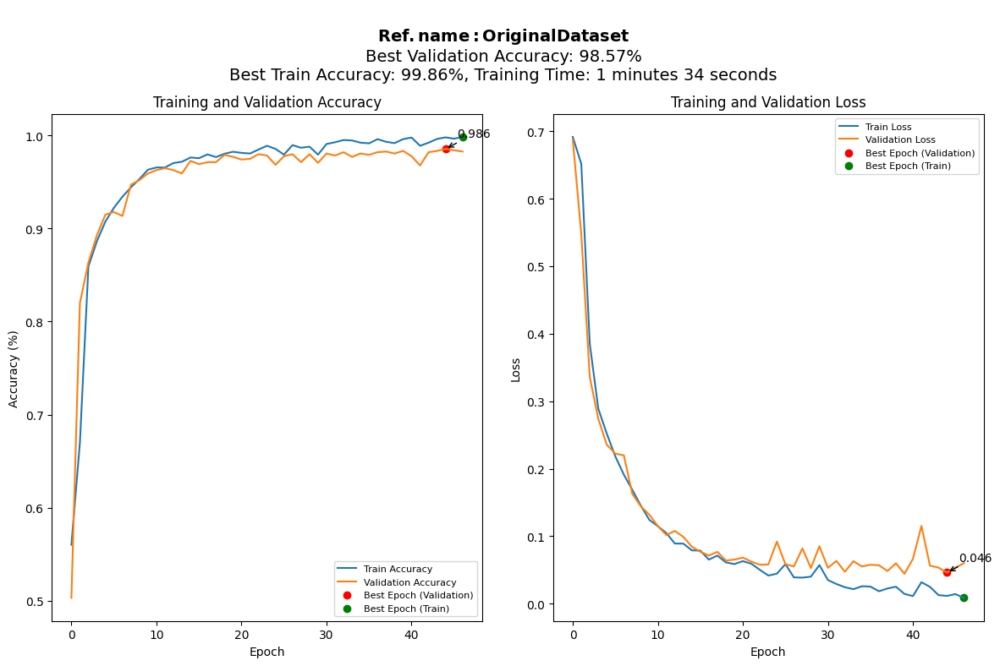

In [246]:
def get_history(model,
                training_time:float, 
                ref_name:str):

        best_epoch = np.argmax(history.history['val_accuracy'])
        best_train_epoch = np.argmax(history.history['accuracy'])

        # Create a 1x2 grid of subplots with smaller size
        fig, axes = plt.subplots(1, 2, figsize=(12, 8))

        # Plot training and validation accuracy
        axes[0].plot(history.epoch, history.history['accuracy'],
                     label='Train Accuracy')
        axes[0].plot(history.epoch, history.history['val_accuracy'],
                     label='Validation Accuracy')
        axes[0].scatter(best_epoch, history.history['val_accuracy']
                        [best_epoch], color='r', label='Best Epoch (Validation)')
        axes[0].scatter(best_train_epoch, history.history['accuracy']
                        [best_train_epoch], color='g', label='Best Epoch (Train)')

        # Annotate the best validation accuracy point
        best_accuracy = history.history['val_accuracy'][best_epoch]
        axes[0].annotate(f'{best_accuracy:.3f}',
                         xy=(best_epoch, best_accuracy),
                         xytext=(10, 10),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        axes[0].set_xlabel('Epoch', fontsize=10)
        axes[0].set_ylabel('Accuracy (%)', fontsize=10)
        axes[0].set_title('Training and Validation Accuracy', fontsize=12)
        axes[0].legend(fontsize=8)

        # Plot training and validation loss
        axes[1].plot(history.epoch,
                    history.history['loss'], label='Train Loss')
        axes[1].plot(history.epoch, history.history['val_loss'],
                     label='Validation Loss')
        axes[1].scatter(best_epoch, history.history['val_loss']
                        [best_epoch], color='r', label='Best Epoch (Validation)')
        axes[1].scatter(best_train_epoch,history.history['loss']
                        [best_train_epoch], color='g', label='Best Epoch (Train)')
        axes[1].set_xlabel('Epoch', fontsize=10)
        axes[1].set_ylabel('Loss', fontsize=10)
        axes[1].set_title('Training and Validation Loss', fontsize=12)
        axes[1].legend(fontsize=8)

        # Annotate the best validation loss point
        best_loss = history.history['val_loss'][best_epoch]
        axes[1].annotate(f'{best_loss:.3f}',
                         xy=(best_epoch, best_loss),
                         xytext=(10, 10),
                         textcoords='offset points',
                         arrowprops=dict(arrowstyle='->'))

        # Calculate best validation accuracy in percentage
        best_accuracy_percentage = round(best_accuracy * 100, 2)

        # String for performance, accuracy, and training time
        minutes = int(training_time // 60)
        seconds = int(training_time % 60)

        # Set the text for the parameters on the right side
        performance = r'$\bf{' + f'Ref. name: {ref_name}' + '}$' + f"\nBest Validation Accuracy: {best_accuracy_percentage}%" + \
            f"\nBest Train Accuracy: {history.history['accuracy'][best_train_epoch] * 100:.2f}%" + \
            f", Training Time: {minutes} minutes {seconds} seconds"
        fig.suptitle(r'$\bf{''}$' +
                     '\n' + performance, fontsize=14)

        plt.tight_layout()
        plt.show()

get_history(model=cnn_model,
            training_time=training_time, 
            ref_name='Original Dataset')


In [247]:
import json
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, accuracy_score, roc_curve, roc_auc_score, f1_score

In [248]:
def evaluate1(model_name, model, X, y_actual, subset_name, training_time, threshold=None):

        # Model Prediction/Y hat
        y_pred = model.predict(X) 
        # Handling Output Layer of Activation='sigmoid'
        threshold = threshold if threshold else 0.5
        y_pred_binary = (y_pred > threshold).astype(int).flatten()

        # Calculate ROC curve and AUC score
        fpr, tpr, thresholds = roc_curve(y_actual, y_pred_binary)
        auc_score = roc_auc_score(y_actual, y_pred_binary)
        # Classification Report
        report = classification_report(
            y_actual, y_pred_binary, output_dict=True)
        report_dict = json.loads(json.dumps(report))

        # Extract precision and recall from report_dict
        precision = report_dict['weighted avg']['precision']
        recall = report_dict['weighted avg']['recall']
        accuracy = report_dict['accuracy']
        f1 = report_dict['weighted avg']['f1-score']

        # Confusion Matrix
        cm = confusion_matrix(y_actual, y_pred_binary)
        TP = cm[0][0]
        FP = cm[0][1]
        FN = cm[1][0]
        TN = cm[1][1]
        total_seconds = training_time
        minutes = int(training_time // 60)
        seconds = int(training_time % 60)
        training_time_ = "{} minutes {} seconds".format(minutes, seconds)

        accuracy_train = history.history['accuracy']
        accuracy_val = history.history['val_accuracy']

        performance_info = {
            'Model': model_name,
            'accuracy_train': accuracy_train,
            'accuracy_val': accuracy_val,
            'Subset': subset_name,
            'Training time': training_time_,
            'Training in seconds': total_seconds,
            'TP': TP,
            'FP': FP,
            'FN': FN,
            'TN': TN,
            'Precision': precision,
            'Recall': recall,
            'F1': f1,
            'AUC': auc_score,
            'Accuracy': accuracy,
        }
        return pd.DataFrame([performance_info])

### Training Performance

In [249]:
evaluate1(model_name='CNN', 
         model=cnn_model, 
         X=X_train, 
         y_actual=y_train, 
         subset_name='Training',
         training_time=training_time 
         )

132/132 [==============================] - 2s 11ms/step


,Model,accuracy_train,accuracy_val,Subset,Training time,Training in seconds,TP,FP,FN,TN,Precision,Recall,F1,AUC,Accuracy
0,CNN,"[0.5600000023841858, 0.6697618961334229, 0.859...","[0.5028571486473083, 0.8199999928474426, 0.863...",Training,1 minutes 34 seconds,94.090964,2099,1,3,2097,0.999048,0.999048,0.999048,0.999048,0.999048


### Testing Performance

In [250]:
evaluate1(model_name='CNN', 
         model= cnn_model, 
         X=X_test, 
         y_actual=y_test, 
         subset_name='Test', 
         training_time=training_time
         )

44/44 [==============================] - 0s 7ms/step


,Model,accuracy_train,accuracy_val,Subset,Training time,Training in seconds,TP,FP,FN,TN,Precision,Recall,F1,AUC,Accuracy
0,CNN,"[0.5600000023841858, 0.6697618961334229, 0.859...","[0.5028571486473083, 0.8199999928474426, 0.863...",Test,1 minutes 34 seconds,94.090964,691,9,8,692,0.987858,0.987857,0.987857,0.987857,0.987857


In [257]:
def plot_confusion_matrix(y_actual, y_pred, subset_name):
    y_pred_binary = (y_pred > 0.5).astype(int).flatten()
    cm = confusion_matrix(y_actual, y_pred_binary)
    labels = ['Negative', 'Positive']
    tn, fp, fn, tp = cm.ravel() # it is used to flatten a multi dimensional array into a 1d array
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {subset_name}\n'
              f'TP: {tp} | TN: {tn} | FP: {fp} | FN: {fn}\n'
              f'Sensitivity: {sensitivity:.3f} | Specificity: {specificity:.3f}')
    plt.show()

In [258]:
y_pred_test = cnn_model.predict(X_test)

44/44 [==============================] - 0s 9ms/step


### Confusion Matrix

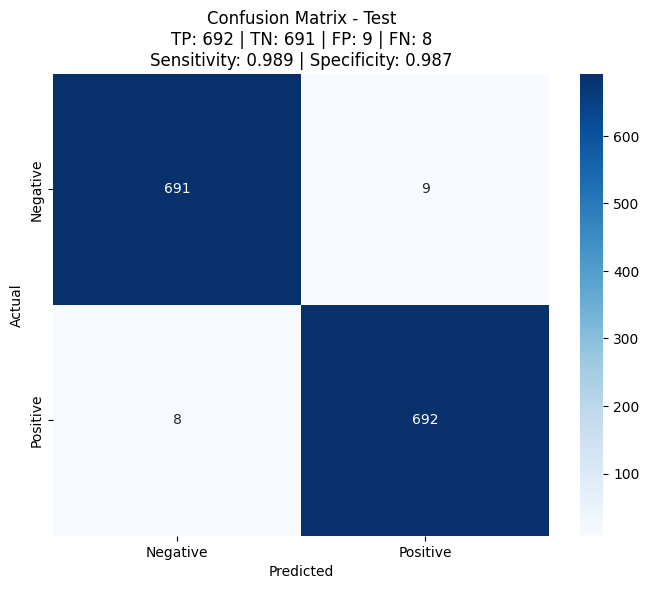

In [259]:
plot_confusion_matrix(y_actual=y_test, 
                      y_pred=y_pred_test, 
                      subset_name='Test')

## ROC

In [266]:
def plot_roc(y_actual, y_pred, subset_name):
    fpr, tpr, thresholds = roc_curve(y_actual, y_pred)
    # Print ROC Curve
    plt.figure(figsize=(12,9))
    plt.plot(fpr, tpr, marker='o', linestyle='-',)
    plt.xlabel('False positive rate (1-Specificity)')
    plt.ylabel('True positive rate (Sensitivity)')
    plt.title(f'ROC Curve - {subset_name}')
    plt.grid()
    plt.show()

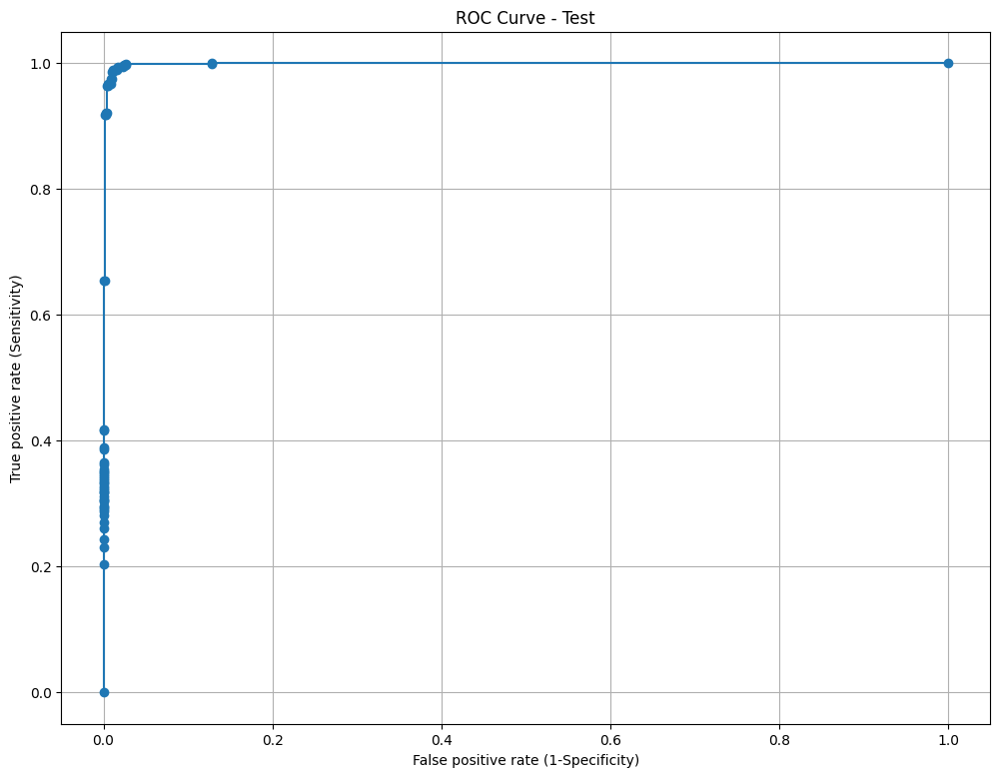

In [267]:
plot_roc(y_actual=y_test, y_pred=y_pred_test, subset_name='Test')

# Model Prediction

In [262]:
def compare_actual_and_predicted_xray(estimator, images, target, title, num_display=16, num_cols=4, random_mode=False):
    '''
    Compare Actual X-ray Images with Model Predictions.
    This function generates a visual comparison between actual X-ray images and their corresponding model predictions. It displays a grid of images with labels to show whether the model's predictions match the actual target values. The grid is organized in rows and columns based on the specified parameters.

    The function does not return any values; it displays the comparison plot directly.
    '''

    n_cols = min(num_cols, num_display)
    n_rows = int(np.ceil(num_display / n_cols))

    title = r'$\bf{' + "Actual-Image" + '}$' + " vs " + \
        r'$\bf{' + "Model-Prediction" + '}$'
    y_hat = estimator.predict(images)
    prediction = (y_hat > 0.5).astype(int).flatten()

    n_images = min(num_display, len(images))
    if random_mode:
        random_indices = np.random.choice(
            len(images), num_display, replace=False)
    else:
        random_indices = np.arange(num_display)

    fig, axes = plt.subplots(
        nrows=n_rows, ncols=n_cols, figsize=(20, 4*n_rows))
    for i, ax in enumerate(axes.flatten()):
        if i >= n_images:  # Check if the index exceeds the available number of images
            break
        # Incase (Did PCA)
        index = random_indices[i]
        if len(images.shape) == 2:
            image = images[index].reshape((128, 128)).astype(int)
        else:
            image = images[index]
        actual_label = target[index]
        model_pred_label = prediction[index]
        model_prob = '{:.3f}'.format(float(y_hat[index]))
        ax.imshow(
            image, cmap='gray' if actual_label == model_pred_label else 'OrRd')
        ax.set_title(
            f"Actual: {actual_label},\nModel Prediction: {model_pred_label}\nProbability: {model_prob}")
    plt.suptitle(f"{title} (Displaying {num_display} Images)",
                 fontsize=16, fontweight='bold')

    fig.set_facecolor('white')
    plt.tight_layout()  
    plt.show()

44/44 [==============================] - 0s 8ms/step


C:\Users\forbh\AppData\Local\Temp\ipykernel_26720\4088684852.py:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  model_prob = '{:.3f}'.format(float(y_hat[index]))


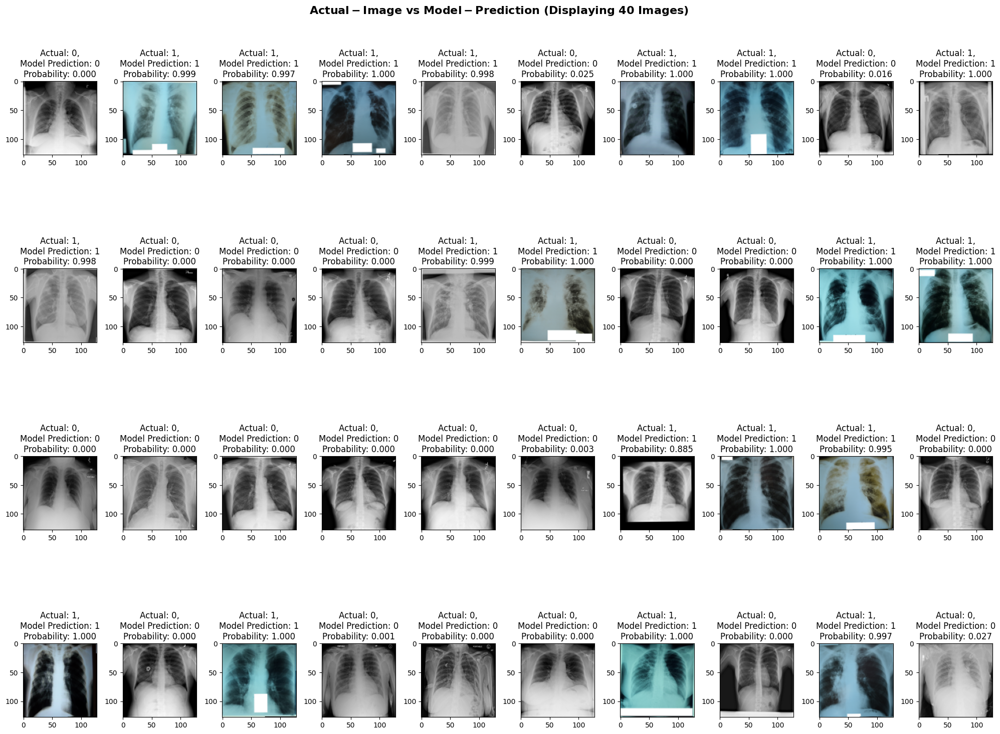

In [263]:
compare_actual_and_predicted_xray(
                estimator=cnn_model,
                images=X_test,
                target=y_test, 
                title=None,
                num_display=40,
                num_cols=10, 
                random_mode=True)

## Using VGG19

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16,VGG19
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras import regularizers

In [ ]:
# Load the VGG16 model pre-trained on ImageNet without the top classification layer
vgg_base = VGG19(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the convolutional layers
for layer in vgg_base.layers:
    layer.trainable = False

# Add custom classification layers on top of VGG16
model = Sequential([
    vgg_base,
    Flatten(),
    Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    BatchNormalization(),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train, y_train, epochs=45, batch_size=64, validation_data=(X_val, y_val), verbose=1, callbacks=[early_stopping])



Epoch 1/45
66/66 [==============================] - 185s 3s/step - loss: 1.5835 - accuracy: 0.9550 - val_loss: 0.6200 - val_accuracy: 0.9564
Epoch 2/45
66/66 [==============================] - 179s 3s/step - loss: 0.3921 - accuracy: 0.9767 - val_loss: 0.2753 - val_accuracy: 0.9836
Epoch 3/45
66/66 [==============================] - 184s 3s/step - loss: 0.2281 - accuracy: 0.9800 - val_loss: 0.1970 - val_accuracy: 0.9821
Epoch 4/45
66/66 [==============================] - 184s 3s/step - loss: 0.1620 - accuracy: 0.9833 - val_loss: 0.2147 - val_accuracy: 0.9514
Epoch 5/45
66/66 [==============================] - 183s 3s/step - loss: 0.1603 - accuracy: 0.9788 - val_loss: 0.1805 - val_accuracy: 0.9636
Epoch 6/45
66/66 [==============================] - 182s 3s/step - loss: 0.1460 - accuracy: 0.9795 - val_loss: 0.2275 - val_accuracy: 0.9457
Epoch 7/45
66/66 [==============================] - 181s 3s/step - loss: 0.1205 - accuracy: 0.9864 - val_loss: 0.1220 - val_accuracy: 0.9879
Epoch 8/45
66

In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}')

training_accuracy = history.history['accuracy'][-1]
print(f'Training Accuracy: {training_accuracy:.4f}')

44/44 [==============================] - 45s 1s/step - loss: 0.1267 - accuracy: 0.9807
Test Loss: 0.1267, Test Accuracy: 0.9807
Training Accuracy: 0.9852


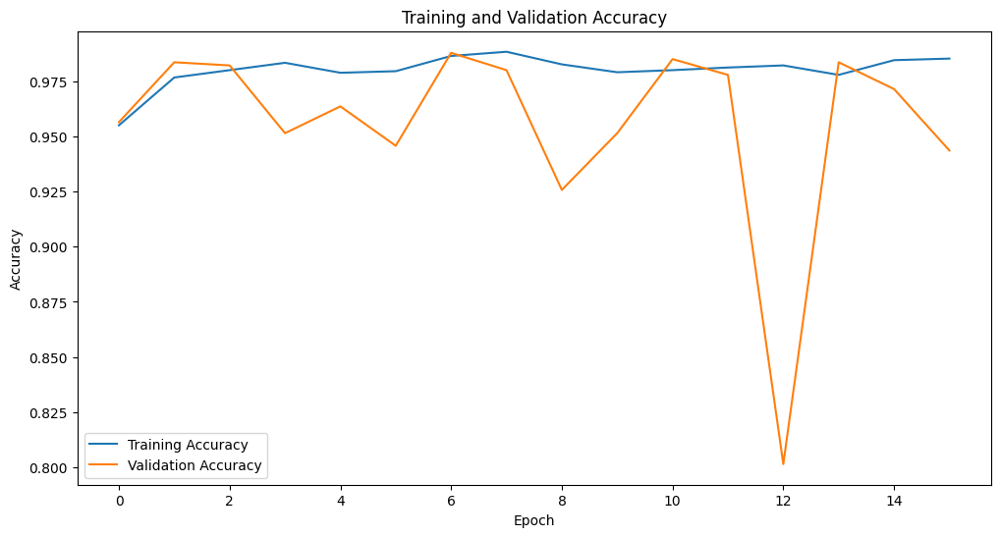

In [ ]:
# Plot training history
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

44/44 [==============================] - 45s 1s/step


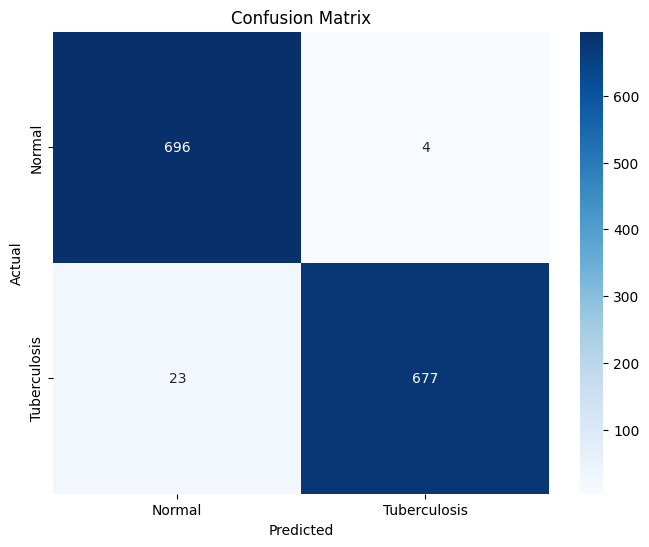

44/44 [==============================] - 45s 1s/step
Classification Report for VGG16
              precision    recall  f1-score   support

           0     0.9680    0.9943    0.9810       700
           1     0.9941    0.9671    0.9804       700

    accuracy                         0.9807      1400
   macro avg     0.9811    0.9807    0.9807      1400
weighted avg     0.9811    0.9807    0.9807      1400



In [ ]:
# Confusion Matrix
y_pred = model.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(int).flatten()
cm = confusion_matrix(y_test, y_pred_binary)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Tuberculosis'], yticklabels=['Normal', 'Tuberculosis'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Classification Report
from sklearn.metrics import classification_report

# Define the model name
model_name = "VGG16"

# Evaluate the model and print the classification report
evaluation_result = evaluate1(model_name, model, X_test, y_test, "Test Set", training_time)

# Print the classification report
print("Classification Report for", model_name)
print(classification_report(y_test, y_pred_binary, digits=4))

## Using ResNet50

In [256]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras import regularizers
# Load the ResNet50 model pre-trained on ImageNet without the top classification layer
resnet_base = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the convolutional layers
for layer in resnet_base.layers:
    layer.trainable = False

import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import seaborn as sns

# Define the number of folds for cross-validation
k_folds = 5

# Initialize lists to store training, validation, and test accuracies
train_accuracies = []
val_accuracies = []
test_accuracies = []

# Initialize KFold object
kf = KFold(n_splits=k_folds, shuffle=True)

# Iterate over each fold
for fold, (train_index, val_index) in enumerate(kf.split(X_train, y_train), 1):
    print(f'Fold {fold}/{k_folds}')

    # Create a new model instance for each fold
    model = Sequential([
        resnet_base,
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    # Compile the model
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

    # Define early stopping criteria
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

    # Get training and validation data for this fold
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # Train the model
    history = model.fit(X_train_fold, y_train_fold, epochs=45, batch_size=64,
                        validation_data=(X_val_fold, y_val_fold), verbose=1,
                        callbacks=[early_stopping])

    # Evaluate the model on training, validation, and test data
    train_loss, train_accuracy = model.evaluate(X_train_fold, y_train_fold, verbose=0)
    val_loss, val_accuracy = model.evaluate(X_val_fold, y_val_fold, verbose=0)
    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

    # Print the training, validation, and test accuracies for this fold
    print(f'Training Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}\n')

    # Store the training, validation, and test accuracies
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
    test_accuracies.append(test_accuracy)

# Calculate and print the average training, validation, and test accuracies across all folds
avg_train_accuracy = np.mean(train_accuracies)
avg_val_accuracy = np.mean(val_accuracies)
avg_test_accuracy = np.mean(test_accuracies)
print(f'Average Training Accuracy: {avg_train_accuracy:.4f}, Average Validation Accuracy: {avg_val_accuracy:.4f}, Average Test Accuracy: {avg_test_accuracy:.4f}')


Fold 1/5
Epoch 1/45
53/53 [==============================] - 106s 2s/step - loss: 0.7799 - accuracy: 0.5676 - val_loss: 0.6189 - val_accuracy: 0.7381
Epoch 2/45
53/53 [==============================] - 115s 2s/step - loss: 0.6116 - accuracy: 0.6827 - val_loss: 0.5725 - val_accuracy: 0.7440
Epoch 3/45
53/53 [==============================] - 68s 1s/step - loss: 0.5670 - accuracy: 0.7238 - val_loss: 0.4992 - val_accuracy: 0.8357
Epoch 4/45
53/53 [==============================] - 63s 1s/step - loss: 0.4961 - accuracy: 0.7854 - val_loss: 0.4400 - val_accuracy: 0.8524
Epoch 5/45
53/53 [==============================] - 57s 1s/step - loss: 0.4603 - accuracy: 0.7976 - val_loss: 0.4046 - val_accuracy: 0.8607
Epoch 6/45
53/53 [==============================] - 106s 2s/step - loss: 0.4244 - accuracy: 0.8199 - val_loss: 0.3862 - val_accuracy: 0.8536
Epoch 7/45
53/53 [==============================] - 140s 3s/step - loss: 0.3787 - accuracy: 0.8393 - val_loss: 0.3356 - val_accuracy: 0.8786
Epoch 8

## Using ResNet101

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras import regularizers
# Load the ResNet50 model pre-trained on ImageNet without the top classification layer
resnet_base = ResNet101(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the convolutional layers
for layer in resnet_base.layers:
    layer.trainable = False

# Add custom classification layers on top of ResNet50
model = Sequential([
    resnet_base,
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train, y_train, epochs=45, batch_size=64, validation_data=(X_val, y_val), verbose=1, callbacks=[early_stopping])


In [82]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import seaborn as sns

# Define the number of folds for cross-validation
k_folds = 5

# Initialize lists to store training, validation, and test accuracies
train_accuracies = []
val_accuracies = []
test_accuracies = []

# Initialize KFold object
kf = KFold(n_splits=k_folds, shuffle=True)

# Iterate over each fold
for fold, (train_index, val_index) in enumerate(kf.split(X_train, y_train), 1):
    print(f'Fold {fold}/{k_folds}')

    # Create a new model instance for each fold
    model = Sequential([
        resnet_base,
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    # Compile the model
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

    # Define early stopping criteria
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

    # Get training and validation data for this fold
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # Train the model
    history = model.fit(X_train_fold, y_train_fold, epochs=45, batch_size=64,
                        validation_data=(X_val_fold, y_val_fold), verbose=1,
                        callbacks=[early_stopping])

    # Evaluate the model on training, validation, and test data
    train_loss, train_accuracy = model.evaluate(X_train_fold, y_train_fold, verbose=0)
    val_loss, val_accuracy = model.evaluate(X_val_fold, y_val_fold, verbose=0)
    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

    # Print the training, validation, and test accuracies for this fold
    print(f'Training Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}\n')

    # Store the training, validation, and test accuracies
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
    test_accuracies.append(test_accuracy)

# Calculate and print the average training, validation, and test accuracies across all folds
avg_train_accuracy = np.mean(train_accuracies)
avg_val_accuracy = np.mean(val_accuracies)
avg_test_accuracy = np.mean(test_accuracies)
print(f'Average Training Accuracy: {avg_train_accuracy:.4f}, Average Validation Accuracy: {avg_val_accuracy:.4f}, Average Test Accuracy: {avg_test_accuracy:.4f}')


Fold 1/5


Epoch 1/45
53/53 [==============================] - 127s 2s/step - loss: 0.8069 - accuracy: 0.5574 - val_loss: 0.6552 - val_accuracy: 0.5143
Epoch 2/45
53/53 [==============================] - 108s 2s/step - loss: 0.6263 - accuracy: 0.6571 - val_loss: 0.5806 - val_accuracy: 0.7690
Epoch 3/45
53/53 [==============================] - 109s 2s/step - loss: 0.5804 - accuracy: 0.7089 - val_loss: 0.5428 - val_accuracy: 0.7774
Epoch 4/45
53/53 [==============================] - 108s 2s/step - loss: 0.5487 - accuracy: 0.7318 - val_loss: 0.4954 - val_accuracy: 0.8202
Epoch 5/45
53/53 [==============================] - 109s 2s/step - loss: 0.4942 - accuracy: 0.7741 - val_loss: 0.4443 - val_accuracy: 0.8333
Epoch 6/45
53/53 [==============================] - 108s 2s/step - loss: 0.4435 - accuracy: 0.8158 - val_loss: 0.3818 - val_accuracy: 0.8738
Epoch 7/45
53/53 [==============================] - 109s 2s/step - loss: 0.4230 - accuracy: 0.8190 - val_loss: 0.3946 - val_accuracy: 0.8405
Epoch 8/45
53

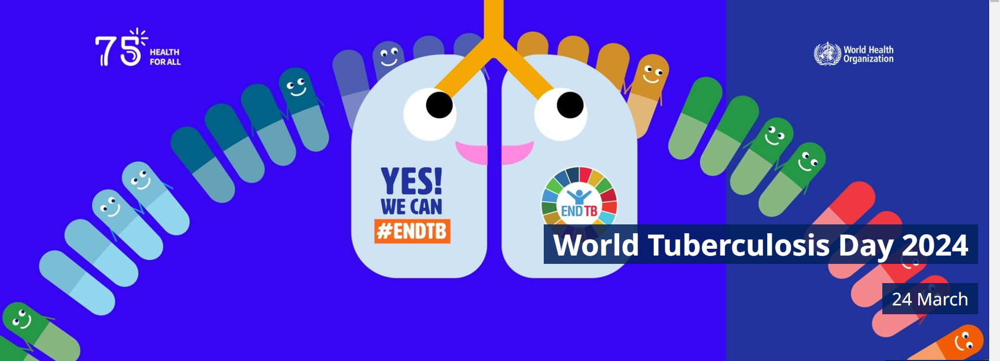


In [236]:
# import numpy as np # linear algebra
# import tensorflow as tf # for tensorflow based registration
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# from skimage.util import montage as montage2d
# import os
# from cv2 import imread, createCLAHE # read and equalize images
# import cv2
# from glob import glob
# %matplotlib inline
# import matplotlib.pyplot as plt

In [85]:
# import os
# from glob import glob

# # Define the directory containing CXR images
# image_dir = r"C:\Users\forbh\Downloads\dnn project folder\TB_Chest_Radiography_Database"

# # Get paths to all CXR images
# image_files = os.listdir(image_dir)
# image_count = len(image_files)

# # Create a list of tuples containing each CXR image path and its corresponding left and right mask paths
# cxr_images = []
# for subset in ['Normal', 'Tuberculosis']:  # Assuming 'Normal' and 'Tuberculosis' are the subsets
#     subset_dir = os.path.join(image_dir, subset)
#     if not os.path.exists(subset_dir):
#         os.makedirs(subset_dir)  # Create the subset directory if it doesn't exist

#     for i in range(image_count):
#         cxr_path = os.path.join(subset_dir, f'{subset}-{i}.png')
#         left_mask_path = os.path.join(subset_dir, 'ManualMask', 'leftMask', f'{subset}-{i}.png')
#         right_mask_path = os.path.join(subset_dir, 'ManualMask', 'rightMask', f'{subset}-{i}.png')
        
#         cxr_images.append((cxr_path, [left_mask_path, right_mask_path]))

# # Print information about the CXR images
# print('Total CXR Images:', len(cxr_images))
# print('First CXR Image Path:', cxr_images[0][0])
# print('First CXR Image and Mask Paths:', cxr_images[0])


In [86]:
# from skimage.io import imread as imread_raw
# from skimage.transform import resize
# import warnings
# from tqdm import tqdm
# warnings.filterwarnings('ignore', category=UserWarning, module='skimage') # skimage is really annoying
# OUT_DIM = (512, 512)
# def imread(in_path, apply_clahe = False):
#     img_data = imread_raw(in_path)
#     n_img = (255*resize(img_data, OUT_DIM, mode = 'constant')).clip(0,255).astype(np.uint8)
#     if apply_clahe:
#         clahe_tool = createCLAHE(clipLimit=2.0, tileGridSize=(16,16))
#         n_img = clahe_tool.apply(n_img)
#     return np.expand_dims(n_img, -1)

In [87]:
# img_vol, seg_vol = [], []

# for img_path, s_paths in tqdm(cxr_images):
#     try:
#         img_vol.append(imread(img_path))
        
#         seg_stack = np.stack([imread(s_path, apply_clahe=False) for s_path in s_paths], 0)
#         seg_max = np.max(seg_stack, 0)
#         seg_vol.append(seg_max)
        
#     except FileNotFoundError as e:
#         print(f"Error reading file: {e}")

# img_vol = np.stack(img_vol, 0)
# seg_vol = np.stack(seg_vol, 0)

# print('Images:', img_vol.shape, 'Segmentations:', seg_vol.shape)


In [88]:
# # we are creating a function that will convert images to numpy arrays
# def numpize(subset: str, img_size=(128, 128), grayscale=False):

#     image_dir = os.path.join(r'C:\Users\forbh\Downloads\dnn project folder\TB_Chest_Radiography_Database', subset)
#     image_files = os.listdir(image_dir)
#     image_count = len(image_files)
#     transformed_images = []
#     '''
#     so we are using tqdm library to add a progress bar with description as 'Transforming'
#     '''
#     for i in tqdm(range(1, image_count + 1), desc='Transforming...'):  # this loop will iterate from 1 to total images in a subset
#         image_path = f'{image_dir}/{subset}-{i}.png' # this is to create the image path 
#         image = Image.open(image_path)

#         # Ensure all images are in the same format
#         if grayscale:
#             image = image.convert('L')  # Convert to grayscale
#         else:
#             image = image.convert('RGB')  # Convert to RGB

#         # Resize all images to the specified size without padding
#         resized_image = image.resize(img_size)
#         data = np.asarray(resized_image) # converts data into numpy arrays
#         transformed_images.append(data)

    
#     import os
#     from glob import glob

#     # Define the directory containing CXR images
#     image_dir = os.path.join(r"C:\Users\forbh\Downloads\dnn project folder\TB_Chest_Radiography_Database")

#     # Get paths to all CXR images
#     image_files = os.listdir(image_dir)
#     image_count = len(image_files)
#     cxr_paths = glob(os.path.join(image_dir, '*', '*.png'))

#     # Create a list of tuples containing each CXR image path and its corresponding left and right mask paths
#     cxr_images = []
#     for c_path in cxr_paths:
#         base_dir = os.path.dirname(c_path)
#         left_mask_path = os.path.join(base_dir, 'ManualMask', 'leftMask', os.path.basename(c_path))
#         right_mask_path = os.path.join(base_dir, 'ManualMask', 'rightMask', os.path.basename(c_path))
#         cxr_images.append((c_path, [left_mask_path, right_mask_path]))

#     # Print information about the CXR images
#     print('Total CXR Images:', len(cxr_paths))
#     print('First CXR Image Path:', cxr_paths[0])
#     print('First CXR Image and Mask Paths:', cxr_images[0])
